# Business understanding:

   The Citywide Payroll data was collected by the City of New York because of public interest in how the city is using its budget for salary and overtime pay for all municipal employees. The goal in publicizing this data was that it can then be used to analyze how the city's budget is being allocated and how much of the budget is being allocated to overtime. The data could be used to analyze how pay or amount of overtime varies by position or agency, and it may also be possible to make classification predictions such as job title or workplace borough based on factors such as agency, pay, or experience. 
   
   The first value we looked at predicting was base salary. There are several values that may affect base salary such as job title, work location, work agency, or start date. Similarly, overt time hours and overtime paid could also be predicted from the dataset using similar predictors.  In any of these cases the goal would be to find the algorithm that minimizes the RMSE. The RMSE tells us how much error we have plus or minus from the actual value, so the smaller the RMSE, the closer the prediction is to the real value. 
    
   If we were predicting something like job title or workplace location based on pay and other factors, I would look to increase not only the classification accuracy, but the sensitivity and specificity of the algorithm as well. An algorithm can be accurate but could have a very high false positive or negative rate and it is important to make sure to minimize false predictions. To retrieve the accuracy values, we would validate the algorithm using 10-fold cross validation.

In [1]:
# Import pandas and other useful libraries
from __future__ import print_function
from sklearn import metrics as mt
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import cross_validate
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn import svm
from sklearn.naive_bayes import MultinomialNB
from imblearn.over_sampling import SMOTE
from ipywidgets import widgets as wd
from pandas.plotting import scatter_matrix

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt

import warnings
warnings.simplefilter('ignore', DeprecationWarning)
%matplotlib inline

In [2]:
#set pandas options so that entire dataframe is displayed
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [3]:
#Bring in the data on Andre's laptop
df = pd.read_csv('data\Citywide_Payroll_Data__Fiscal_Year_.csv') # read in the csv file
payroll = df
# data import on Mike's laptop
# payroll = pd.read_csv("C:\\Users\\Mburg\\Documents\\SMU\\Fall 2021\\ML 1\\Project 1\\Data Sets\\New York datasets\\Citywide_Payroll_Data__Fiscal_Year_.csv", header = 0, index_col=False, low_memory=False)

c:\programdata\anaconda3\envs\gradschool\lib\site-packages\IPython\core\interactiveshell.py:3072: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [4]:
#verify data was imported correctly
payroll.head()

,Fiscal Year,Payroll Number,Agency Name,Last Name,First Name,Mid Init,Agency Start Date,Work Location Borough,Title Description,Leave Status as of June 30,Base Salary,Pay Basis,Regular Hours,Regular Gross Paid,OT Hours,Total OT Paid,Total Other Pay
0,2020,17.0,OFFICE OF EMERGENCY MANAGEMENT,BEREZIN,MIKHAIL,NaN,08/10/2015,BROOKLYN,EMERGENCY PREPAREDNESS MANAGER,ACTIVE,86005.0,per Annum,1820.0,84698.21,0.0,0.0,0.0
1,2020,17.0,OFFICE OF EMERGENCY MANAGEMENT,GEAGER,VERONICA,M,09/12/2016,BROOKLYN,EMERGENCY PREPAREDNESS MANAGER,ACTIVE,86005.0,per Annum,1820.0,84698.21,0.0,0.0,0.0
2,2020,17.0,OFFICE OF EMERGENCY MANAGEMENT,RAMANI,SHRADDHA,NaN,02/22/2016,BROOKLYN,EMERGENCY PREPAREDNESS MANAGER,ACTIVE,86005.0,per Annum,1820.0,84698.21,0.0,0.0,0.0
3,2020,17.0,OFFICE OF EMERGENCY MANAGEMENT,ROTTA,JONATHAN,D,09/16/2013,BROOKLYN,EMERGENCY PREPAREDNESS MANAGER,ACTIVE,86005.0,per Annum,1820.0,84698.21,0.0,0.0,0.0
4,2020,17.0,OFFICE OF EMERGENCY MANAGEMENT,WILSON II,ROBERT,P,04/30/2018,BROOKLYN,EMERGENCY PREPAREDNESS MANAGER,ACTIVE,86005.0,per Annum,1820.0,84698.21,0.0,0.0,0.0


# Data Meaning Type

The data consist of the following 17 attributes in 3,923,290 rows:

Year – The fiscal year data is being reported for. Spans 2014 – 2020. Numeric value.

Payroll Number – Unique numeric identifier for the payroll agency. 157 unique numbers. Numeric value.

Agency Name – The Payroll agency that the employee works for. 165 unique agencies. Text.

Last Name – Employee’s last name. Text. 

First Name – Employee’s first name. Text.

Mid Init – Employee’s middle initial. Text.

Agency Start Date – Date which employee began working for their current agency. Date and time field as MM/DD/YYYY.

Work Location Borough – Borough of employee’s primary work location. 22 unique values. Text.

Title Description - Civil service title of employee. 1,802 unique job titles. Text.

Leave Status as of June 30 – NYC Fiscal Year runs July 1st to June 30th. Leave status of employee as of closing of relevant fiscal year. Valid values are Active, Ceased, On Leave, On Separation Leave, or Seasonal.  Text.

Base Salary – Employee’s Base Salary measured in individual dollars and cents. Numeric value.

Pay Basis – How employee is paid. Valid values are per Annum, per Hour, Prorated Annual, or per Day. Text.

Regular Hours – Number of regular hours employee worked in the fiscal year. Numeric value.

Regular Gross Paid – The amount paid to the employee for base salary during the fiscal year. Measured in individual dollars and cents. Numeric value.

OT Hours – Overtime hours worked by employee in the fiscal year. Numeric value.

Total OT Paid – Total overtime pay paid to employee in the fiscal year. Measured in individual dollars and cents. Numeric Value.

Total Other Pay – includes any compensation in addition to gross salary overtime. Includes bonuses, meal allowances, uniform allowance, etc. Measured in individual dollars and cents. Numeric value.

It is important to note that Base Salary fluctuates with Pay Basis. For example, hourly employees have their hourly rate listed while per annum employees have their yearly salary listed. To normalize this column, we multipled the base rate for the hourly employees by their regular hours worked to calculate an annual salary. For per day employees, we divided the Regular Hours by 8 to caclulate an hourly rate and then multipled the new hourly rate by the number of regular hours worked to calculate an annual salary. An alternate option would have been to calculate the hourly rates of employees paid by yearly or daily salary, however because each row represents an entire fiscal year it made more sense to us to calculate a yearly salary for each employee.

In [5]:
#dimensions of inital dataframe
payroll.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3923290 entries, 0 to 3923289
Data columns (total 17 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   Fiscal Year                 int64  
 1   Payroll Number              float64
 2   Agency Name                 object 
 3   Last Name                   object 
 4   First Name                  object 
 5   Mid Init                    object 
 6   Agency Start Date           object 
 7   Work Location Borough       object 
 8   Title Description           object 
 9   Leave Status as of June 30  object 
 10  Base Salary                 float64
 11  Pay Basis                   object 
 12  Regular Hours               float64
 13  Regular Gross Paid          float64
 14  OT Hours                    float64
 15  Total OT Paid               float64
 16  Total Other Pay             float64
dtypes: float64(7), int64(1), object(9)
memory usage: 508.8+ MB


In [6]:
#number of unique values for each column
payroll.nunique()

Fiscal Year                         7
Payroll Number                    157
Agency Name                       165
Last Name                      157079
First Name                      88231
Mid Init                           43
Agency Start Date               14933
Work Location Borough              22
Title Description                1802
Leave Status as of June 30          5
Base Salary                     98573
Pay Basis                           4
Regular Hours                   86101
Regular Gross Paid            1785527
OT Hours                        52619
Total OT Paid                  806992
Total Other Pay                850763
dtype: int64

In [7]:
#get unique values for fiscal year, work location, leave status, and pay basis
col_list = ['Fiscal Year', 'Work Location Borough', 'Leave Status as of June 30', 'Pay Basis']

for x in col_list:
    print('Unique values in ' + x + ': ' + str(pd.unique(payroll[x])))

Unique values in Fiscal Year: [2020 2016 2015 2014 2017 2018 2019]
Unique values in Work Location Borough: ['BROOKLYN' 'MANHATTAN' 'BRONX' 'RICHMOND' 'QUEENS' 'WASHINGTON DC'
 'ULSTER' 'WESTCHESTER' 'OTHER' 'ALBANY' 'NASSAU' 'DELAWARE' 'SULLIVAN'
 nan 'ORANGE' 'SCHOHARIE' 'DUTCHESS' 'GREENE' 'PUTNAM' 'Bronx' 'Queens'
 'Richmond' 'Manhattan']
Unique values in Leave Status as of June 30: ['ACTIVE' 'CEASED' 'ON LEAVE' 'ON SEPARATION LEAVE' 'SEASONAL']
Unique values in Pay Basis: ['per Annum' 'per Hour' 'Prorated Annual' 'per Day']


# Data Quality

   The overall data quality is excellent with only a little more than 5% of the total dataset missing and only 17 duplicate rows. As the duplicates represent such a small fraction of the total dataset, it is probably safe to assume that these represent data entry errors and they can be dropped without affecting overall data quality. It is important to note, however, that the data dictionary for this dataset states that all entries were manually entered and there may be data entry errors that are not obvious without knowing more about the data.
    
   Regarding the missing values, about 41% of the middle initial category is missing. This is not concerning as it has no relevance to making predictions and middle initial, first, and last name can all be dropped safely without affecting data quality.

   Payroll number is missing about 45% of its data. Of the 165 unique agency names, there are 162 that have errors in their payroll numbers. The Police Department and all 6 District Attorney’s offices do not have payroll numbers. Similarly, the department of Juvenile Justice is also missing a payroll number for 97.73% of its entries. However, this is to be expected. The data dictionary for this dataset specifically states that information for some agencies, including the NYPD and DA offices, have been redacted to protect the safety of their employees.   Since there are no null values for agency name and payroll number does not affect the quality of our predictions, we can drop payroll number without affecting data quality and treat the agency name as a unique identifier instead. 

   Work location borough is missing about 13% of its data or 506,226 rows. This is not confined to any one specific agency or job title as all job titles and agencies are missing data for work location. However, there are trends in the data that can help to explain some of the missing values. For example, per session teachers make up 14.74% of the entries without a primary work location (74,607/506,226). We also see large numbers for police officers, election workers, and both Fire Department and Parks and Recreation staff. It is quite possible that many of these workers rotate from location to location throughout the city and do not have a dedicated primary work location that they are assigned to. Although the numbers may appear large, the per session teachers without a work location only make up about 12.56% of the total number of per session teachers in the entire dataset (74,607/594,024). It may be possible to remove these rows as outliers, a unique subset of the data, or as data entry errors. This column also includes counties and other locations where New York City employees work and the data could be subsetted to only include the boroughs of New York City or the outlying counties, depending on where we wanted to place focus or emphasis.

   The final attributes, agency start date and title description are missing 63 and 84 records respectively. These missing records may be caused data entry error and could be treated as outliers without affecting the overall data quality since they represent such a small portion of the data.
   
   There are also some interesting values for the numeric columns that need to be looked at further. The salary columns, Base Salary and Gross Paid, show a long right tail which is normal for salary data and does not necessarily indicate outliers. There are negative values for Regular Gross Paid, Total OT Paid, and Total Other Pay. These may also not be outliers and may represent cases where employees left the city and had to pay back bonuses, uniform allowances, etc. or may represent adjustments where an employee left or there was an error in the pay or time calculations. 
   
   Unusually, there are also negative values for Regular Hours and Overtime hours. These entries might have been necessary to calculate where an employee left and was overpaid, but could also represent data entry errors. There are 1,186 Regular Hours with negative values and 3,688 OT hours with negative values. Because these entries represent less than 1% of the total data, it is probably safe to treat them as an error and to drop these rows.

In [8]:
#count duplicates
len(payroll)-len(payroll.drop_duplicates())

17

In [9]:
#number of missing values for entire dataframe
print('Total Missing Values: ' + str(payroll.isna().sum().sum()))

#percent of missing data for entire dataframe
print('Percent of Total Data Missing ' + str(round((payroll.isna().sum().sum()/(3923290*17))*100,2)))

Total Missing Values: 3852101
Percent of Total Data Missing 5.78


In [10]:
#create data frame to hold info about missing data fore each column
missing_info = pd.DataFrame(columns =['Column Name', 'Number of Missing Values', 'Percent of Data Missing'])

#add information about missing data to data frame
#percent missing is calculated by dividing the number of NAN values by the total length of the dataframe
for col in payroll:
    missing_info.loc[len(missing_info)] = [col, payroll[col].isna().sum(), round(((payroll[col].isna().sum()/3923290)*100),2)]
    
missing_info

,Column Name,Number of Missing Values,Percent of Data Missing
0,Fiscal Year,0,0.00
1,Payroll Number,1745440,44.49
2,Agency Name,0,0.00
3,Last Name,2049,0.05
4,First Name,2073,0.05
5,Mid Init,1596166,40.68
6,Agency Start Date,63,0.00
7,Work Location Borough,506226,12.90
8,Title Description,84,0.00
9,Leave Status as of June 30,0,0.00


In [11]:
#create a dataframe with just agency and payroll numbers
payroll_number_missing = payroll.filter(['Agency Name', 'Payroll Number']).copy()

#create a dataframe to hold the agencies with NANs for payroll numbers
payroll_missing = payroll_number_missing[payroll_number_missing['Payroll Number'].isna()]

payroll_missing.head()

,Agency Name,Payroll Number
435,PERSONNEL MONITORS,NaN
546,PERSONNEL MONITORS,NaN
584,PERSONNEL MONITORS,NaN
1043,PERSONNEL MONITORS,NaN
1308,PERSONNEL MONITORS,NaN


In [12]:
#compare the number of total agencies with the number of agencies that appear in the missing payroll number dataframe
print('There are ' + str(len(pd.unique(payroll_missing['Agency Name']))) + ' Agencies with missing payroll numbers vs ' +  
                                      str(len(pd.unique(payroll['Agency Name']))) + ' total Agencies.')

There are 162 Agencies with missing payroll numbers vs 165 total Agencies.


In [13]:
#create dataframe to hold total occurences of each unique agency name
#adapted from https://stackoverflow.com/questions/47136436/python-pandas-convert-value-counts-output-to-dataframe
payroll_total_occurence = payroll['Agency Name'].value_counts()
payroll_total = pd.DataFrame(payroll_total_occurence)
payroll_total_reset = payroll_total.reset_index()
payroll_total_reset.columns = ['Agency Name', 'Total Occurences']

In [14]:
#create dataframe to hold total occurences of missing payroll number for each agency
#adapted from https://stackoverflow.com/questions/47136436/python-pandas-convert-value-counts-output-to-dataframe
payroll_total_missing = payroll_missing['Agency Name'].value_counts()
payroll_total_missing_val = pd.DataFrame(payroll_total_missing)
payroll_total_missing_reset = payroll_total_missing_val.reset_index()
payroll_total_missing_reset.columns = ['Agency Name', 'Total Occurences']

In [15]:
#join missing count frames and format
missing_num = pd.merge(payroll_total_reset, payroll_total_missing_reset, on = 'Agency Name' )
missing_num.columns = ['Agency Name', 'Total Occurences', 'Missing Occurences']
missing_num = missing_num[['Agency Name', 'Missing Occurences', 'Total Occurences']]

In [16]:
#calculate the percent missing for each agency and return the top 10
missing_num['Percent Missing'] = missing_num.apply(lambda row: round((row['Missing Occurences']/row['Total Occurences'])*100, 2), axis = 1)
missing_num = missing_num.sort_values(by=['Percent Missing'], ascending = False)
missing_num.head(n=10)

,Agency Name,Missing Occurences,Total Occurences,Percent Missing
14,Police Department,55619,55619,100.00
70,Bronx DA,935,935,100.00
88,Spec Narcs-DA,251,251,100.00
63,Kings DA,1278,1278,100.00
93,Richmond DA,112,112,100.00
73,Queens DA,660,660,100.00
60,Manhattan DA,1622,1622,100.00
98,DEPARTMENT OF JUVENILE JUSTICE,86,88,97.73
37,PERSONNEL MONITORS,5257,7969,65.97
159,BRONX COMMUNITY BOARD #12,11,20,55.00


In [17]:
#create a dataframe with just agency and work location
borough_missing = payroll.filter(['Agency Name', 'Title Description', 'Work Location Borough']).copy()

#create a dataframe to hold the agencies with NANs for work locations
borough_nas = borough_missing[borough_missing['Work Location Borough'].isna()]

borough_nas.head()

,Agency Name,Title Description,Work Location Borough
162077,DEPT OF ED PEDAGOGICAL,TEACHER SPECIAL EDUCATION,NaN
410488,DEPT OF ED PEDAGOGICAL,TEACHER,NaN
419875,DEPT OF ED PARA PROFESSIONALS,ANNUAL ED PARA,NaN
832842,DEPT OF ED PARA PROFESSIONALS,ANNUAL ED PARA,NaN
835920,DEPT OF ED PARA PROFESSIONALS,ANNUAL ED PARA,NaN


In [18]:
#compare total agencies to agencies missing job location
print('There are ' + str(len(pd.unique(borough_missing['Agency Name']))) + ' Agencies with missing borough locations vs ' +  
                                      str(len(pd.unique(payroll['Agency Name']))) + ' total Agencies.')


#compare total job titles to job titles missing location
print('There are ' + str(len(pd.unique(borough_missing['Title Description']))) + ' jobs with missing borough locations vs ' +  
                                      str(len(pd.unique(payroll['Title Description']))) + ' total job titles.')

There are 165 Agencies with missing borough locations vs 165 total Agencies.
There are 1803 jobs with missing borough locations vs 1803 total job titles.


In [19]:
len(borough_nas)

506226

In [20]:
#count the number of NaNs for each unique agency and return the 10 with the highest counts
borough_nas['Agency Name'].value_counts().nlargest(10)

DEPT OF ED PEDAGOGICAL            100608
DEPT OF ED PER SESSION TEACHER     76334
Police Department                  55619
BOARD OF ELECTION POLL WORKERS     33241
DEPT OF ED PARA PROFESSIONALS      27566
DEPT OF ED HRLY SUPPORT STAFF      23056
FIRE DEPARTMENT                    16555
DEPT OF PARKS & RECREATION         15120
HRA/DEPT OF SOCIAL SERVICES        14765
DEPARTMENT OF EDUCATION ADMIN      13905
Name: Agency Name, dtype: int64

In [21]:
#count the number of NaNs for each unique job title and return the 10 with the highest counts
borough_nas['Title Description'].value_counts().nlargest(10)

TEACHER- PER SESSION         74607
TEACHER                      60421
ELECTION WORKER              32688
POLICE OFFICER               23649
TEACHER SPECIAL EDUCATION    22815
ANNUAL ED PARA               22426
TEACHER-GENERAL ED           12768
CORRECTION OFFICER            8496
F/T SCHOOL AIDE               7955
FIREFIGHTER                   7899
Name: Title Description, dtype: int64

In [22]:
#get total counts for each unique job title and return the 10 with the highest counts
payroll['Title Description'].value_counts().nlargest(10)

TEACHER- PER SESSION         594024
TEACHER                      435112
ELECTION WORKER              232159
ANNUAL ED PARA               191944
TEACHER SPECIAL EDUCATION    181519
POLICE OFFICER               180668
TEACHER-GENERAL ED            84260
CORRECTION OFFICER            69696
FIREFIGHTER                   62057
F/T SCHOOL AIDE               58867
Name: Title Description, dtype: int64

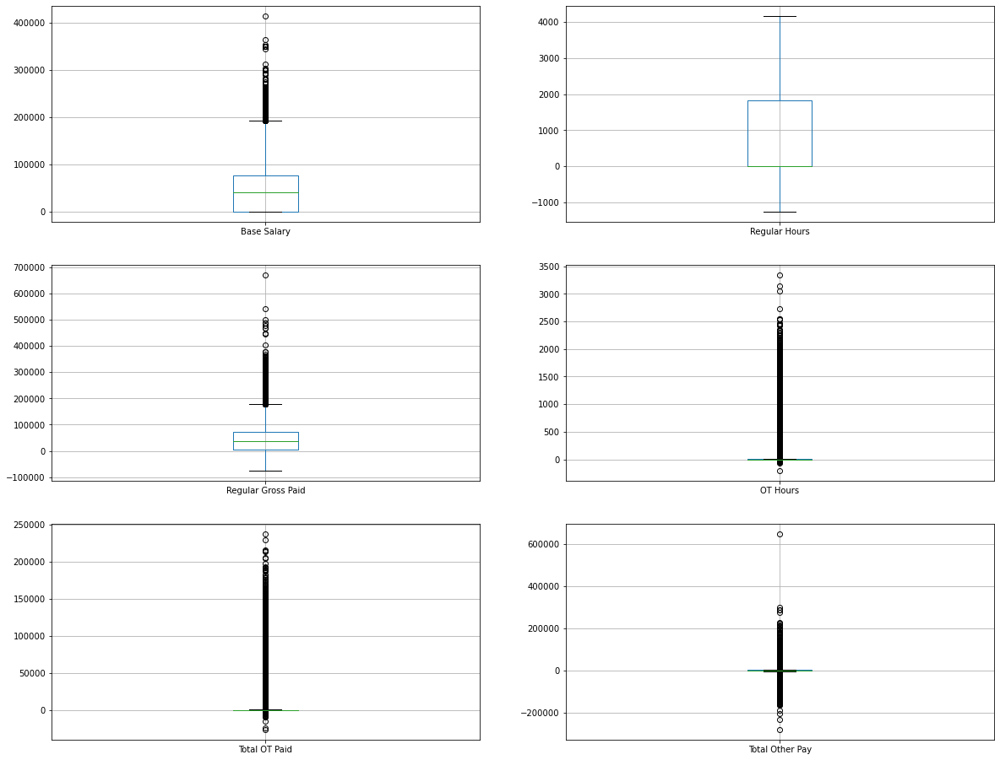

In [23]:
#find outliers for numeric columns
#filter to numeric columns only
payroll_num_only = payroll.filter(['Base Salary', 'Regular Hours', 'Regular Gross Paid', 'OT Hours', 'Total OT Paid', 'Total Other Pay']).copy()


#plot boxplot for each column
#adapted from https://github.com/jakemdrew/DataMiningNotebooks/blob/master/02.%20DataVisualization.ipynb
payroll_separate = [['Base Salary'], ['Regular Hours'],
                   ['Regular Gross Paid'], ['OT Hours'],
                   ['Total OT Paid'], ['Total Other Pay']]
plt.figure(figsize=(20,16))

for index, plot_vars in enumerate(payroll_separate):
    plt.subplot(len(payroll_separate)/2, 2, index+1)
    payroll_plot = payroll_num_only.boxplot(column=plot_vars)
    
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001CAA1E11D08>,
      dtype=object)

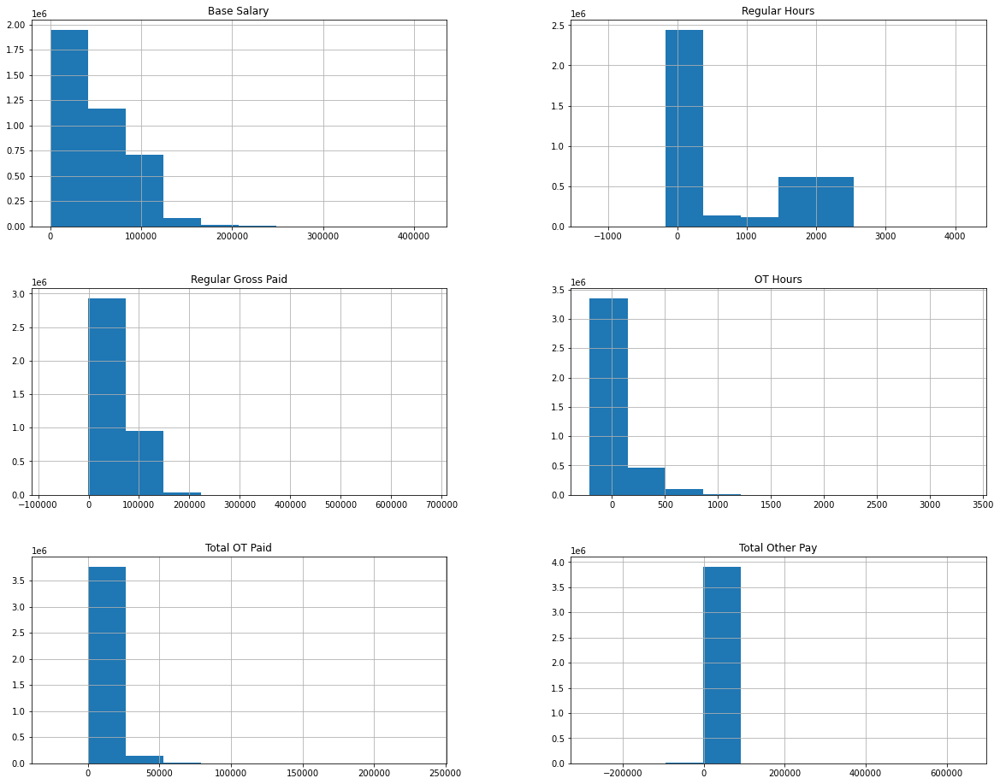

In [24]:
#plot distribution of data for each numeric column
payroll_num_only.hist(figsize = (20, 16))

In [25]:
#How many entries had regular hours less than 0
regular_hours_less = payroll.loc[payroll['Regular Hours'] < 0]
len(regular_hours_less)

1186

In [26]:
#How many entries had regular gross less than 0
regular_gross_less = payroll.loc[payroll['Regular Gross Paid'] < 0]
len(regular_gross_less)

3688

In [27]:
#How many entries had OT Hours less than 0
ot_hours_less = payroll.loc[payroll['Regular Gross Paid'] < 0]
len(ot_hours_less)

3688

In [28]:
#How many entries had total OT paid less than 0
ot_paid_less = payroll.loc[payroll['Regular Gross Paid'] < 0]
len(ot_paid_less)

3688

In [29]:
#how many entries had total other pay less than 0
other_pay_less = payroll.loc[payroll['Total Other Pay'] < 0]
len(other_pay_less)

25470

In [30]:
#create dataframe with only needed columns and remove duplicates and remaining NaNs
#important note: this subsets the data and removes any employee that does not have an assigned work location borough
#removes about 13% of the original data
payroll_clean = payroll[['Fiscal Year', 'Agency Name', 'Agency Start Date', 'Work Location Borough',
                       'Title Description', 'Leave Status as of June 30', 'Base Salary', 'Pay Basis',
                       'Regular Hours', 'Regular Gross Paid', 'OT Hours', 'Total OT Paid', 
                        'Total Other Pay']]

payroll_clean = payroll_clean.drop_duplicates()
payroll_clean = payroll_clean.dropna()
payroll_clean.reset_index(drop=True, inplace=True)

## Simple Statistics

For this section we are using our data set with no missing values. We will do some additional data cleanup here by addressing data types and negative values.  Then we discuss range, mean, median, variance, and counts. 

In [31]:
#Compute percentages of each columns missing data
percent_missing = df.isnull().sum()/len(df)
#Put percents into df 
missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})
#Sort it and show the results
missing_value_df.sort_values('percent_missing', inplace=True)


In [32]:
# missing_value_df.round(5)

In [32]:
# Drop the unnecessary columns
df2 = df[[
            'Fiscal Year',
            'OT Hours',
            'Regular Gross Paid',
            'Regular Hours',
            'Pay Basis',
            'Base Salary',
            'Leave Status as of June 30',
            'Total OT Paid',
            'Agency Name',
            'Agency Start Date',
            'Title Description',
            'Last Name',
            'First Name',
            'Total Other Pay',
            'Work Location Borough'
        ]]

# NAs are very few for these columns.  We will drop them.
def dropNa(array):
    result = df2.dropna(subset=array)
    return result

df2 = dropNa(['Agency Start Date', 'Title Description', 'Last Name', 'First Name', 'Work Location Borough'])


In [33]:
#Compute percentages of each columns missing data
percentMissingDf2 = df2.isnull().sum()/len(df2)
#Put percents into df 
missingValueDf2 = pd.DataFrame({'column_name': df2.columns,
                                 'percent_missing': percentMissingDf2})
#Sort it and show the results
missingValueDf2.sort_values('percent_missing', inplace=True)
missingValueDf2.round(5)

,column_name,percent_missing
Fiscal Year,Fiscal Year,0.0
OT Hours,OT Hours,0.0
Regular Gross Paid,Regular Gross Paid,0.0
Regular Hours,Regular Hours,0.0
Pay Basis,Pay Basis,0.0
Base Salary,Base Salary,0.0
Leave Status as of June 30,Leave Status as of June 30,0.0
Total OT Paid,Total OT Paid,0.0
Agency Name,Agency Name,0.0
Agency Start Date,Agency Start Date,0.0


In [34]:
df2['Pay Basis'] == 'per Hour', ''
dfSample = df2.sample(100000)


#### Negative Values

In [35]:
payroll_clean = df2[['Fiscal Year', 'Agency Name', 'Agency Start Date', 'Work Location Borough',
'Title Description', 'Leave Status as of June 30', 'Base Salary', 'Pay Basis',
'Regular Hours', 'Regular Gross Paid', 'OT Hours', 'Total OT Paid',
'Total Other Pay']]

payroll_clean = payroll_clean.drop_duplicates()
payroll_clean = payroll_clean.dropna()
payroll_clean.reset_index(drop=True, inplace=True)

In [36]:
df2Subset = df2[[
    'Base Salary',
    'OT Hours',
    'Regular Gross Paid',
    'Regular Hours',
    'Total OT Paid',
    'Total Other Pay'
]]
df2Subset.describe().apply(lambda s: s.apply('{0:.2f}'.format))

,Base Salary,OT Hours,Regular Gross Paid,Regular Hours,Total OT Paid,Total Other Pay
count,3414938.00,3414938.00,3414938.00,3414938.00,3414938.00,3414938.00
mean,43682.50,60.77,42335.76,663.86,3298.95,2544.94
std,42084.26,152.77,39708.30,884.07,9027.67,5655.70
min,0.01,-209.00,-76223.05,-1260.00,-26493.88,-281595.04
25%,33.18,0.00,3553.51,0.00,0.00,0.00
50%,42146.00,0.00,36234.91,0.00,0.00,0.25
75%,78026.00,1.00,74472.67,1820.00,166.05,2178.27
max,414707.00,3147.00,672308.86,4160.00,237389.73,650000.00


Notice that there are negative min values for most of our columns.  We will look closer at these values to see if they can possibly be removed. Too many negative values will affect our ability to forecast salary unless we discover a valid reason for having negative values. They might also make it difficult to see the true variability in the data.

We omit the Fiscal Year column. Simple statistics for this attribute are not useful. Treating it as a continuous attribute is useful for sorting and performing comparison operations.

In [37]:
pd.DataFrame({
    'Metric': ['OT HOurs', 'Regular Gross Paid', 'Regular Hours', 'Base Salary', 'Total OT Paid', 'Total Other Pay'],
    'Count': [df2[(df2['OT Hours'] < 0)]['OT Hours'].count(),
              df2[(df2['Regular Gross Paid'] < 0)]['Regular Gross Paid'].count(),
              df2[(df2['Regular Hours'] < 0)]['Regular Hours'].count(),
              df2[(df2['Base Salary'] < 0)]['Base Salary'].count(),
              df2[(df2['Total OT Paid'] < 0)]['Total OT Paid'].count(),
              df2[(df2['Total Other Pay'] < 0)]['Total Other Pay'].count()
             ]
})

,Metric,Count
0,OT HOurs,148
1,Regular Gross Paid,3563
2,Regular Hours,1108
3,Base Salary,0
4,Total OT Paid,1298
5,Total Other Pay,22853


A count of the negative values reveals that there are not enough to effect anything if we remove them.  Our dataset contains more than 3 million records.  We will only remove around 29000.

### Simple Statistics

In [38]:
df2Gte0 = df2[
    (df2['OT Hours'] >= 0) &
    (df2['Regular Gross Paid'] >= 0) &
    (df2['Regular Hours'] >= 0) &
    (df2['Base Salary'] >= 0) &
    (df2['Total OT Paid'] >= 0) &
    (df2['Total Other Pay'] >= 0)
]
# df2Gte0['Fiscal Year'].apply(str)
df2Gte0.describe().apply(lambda s: s.apply('{0:.2f}'.format))

,Fiscal Year,OT Hours,Regular Gross Paid,Regular Hours,Base Salary,Total OT Paid,Total Other Pay
count,3387331.00,3387331.00,3387331.00,3387331.00,3387331.00,3387331.00,3387331.00
mean,2017.52,60.67,42268.29,662.58,43486.68,3288.05,2617.69
std,1.72,152.78,39695.58,883.32,42098.10,9017.95,5445.57
min,2014.00,0.00,0.00,0.00,0.01,0.00,0.00
25%,2016.00,0.00,3547.30,0.00,33.18,0.00,0.00
50%,2018.00,0.00,36123.88,0.00,41992.00,0.00,0.36
75%,2019.00,1.00,74365.21,1820.00,78026.00,158.00,2237.34
max,2020.00,3147.00,672308.86,4160.00,414707.00,237389.73,650000.00


##### Mean, Median, and Range
After removing the negative values, it is interesting to see that the minimum values for Regular Gross Paid, Base Salary, and Regular Hours are zero.  It appears that there are people listed as employees but earn no salary. Zero Regular Hours makes sense because those that are paid annually would not have their hours tracked. The range of these values suggests high variability.

We know that salary data tends to be right skewed. That being the case, it makes more sense to focus on median salaries rather than the mean. Outliers tend to pull the mean to the right. The median is more accurate for this data set.

##### Variance
We have high variance across all of the continuous attributes. We know that the four classes of Pay Basis are included in Base Salary: per Annum, per Day, per Hour, and Prorated Annual. The variance for the remaining attributes is explained by the wide variety of job titles, the amount of compensation, and differences in how they are compensated. For example, a substitute teacher is paid per day. They don't work everyday.  Their Regular Gross Paid attribute is included with that of a Commissioner who has a much higher salary.

##### Mode

In [39]:
dff3= df2Gte0
dff3.mode()

,Fiscal Year,OT Hours,Regular Gross Paid,Regular Hours,Pay Basis,Base Salary,Leave Status as of June 30,Total OT Paid,Agency Name,Agency Start Date,Title Description,Last Name,First Name,Total Other Pay,Work Location Borough
0,2019,0.0,0.0,0.0,per Annum,33.18,ACTIVE,0.0,DEPT OF ED PEDAGOGICAL,01/01/2010,TEACHER- PER SESSION,RODRIGUEZ,MICHAEL,0.0,MANHATTAN


The fact that Manhattan is the Borough that appears most often in this data set adds to the legitimacy of this data. One would expect Manhattan to have the highest number of employees in New York state. It also makes sense that since most employees are paid annually (per Annum), a zero value for OT Hours would be most common.

#### Counts

In [40]:
dff3BaseSalary = dff3[['Base Salary', 'Pay Basis']]
dff3BaseSalary.groupby(['Pay Basis']).describe().apply(lambda s: s.apply('{0:.2f}'.format))

Base Salary                                                   \
                      count      mean       std      min       25%       50%   
Pay Basis                                                                      
Prorated Annual    15573.00  32693.99  15475.38  2282.00  24168.00  31298.00   
per Annum        2014002.00  72657.23  29136.16     1.00  47670.00  71764.00   
per Day           753923.00     81.08     96.85     0.01     33.18     33.18   
per Hour          603833.00    665.23   8776.45     0.50      1.00     13.37   

                                      
                      75%        max  
Pay Basis                             
Prorated Annual  37413.00  165090.00  
per Annum        90432.00  414707.00  
per Day            110.29     999.90  
per Hour            15.97  160683.39

The high variation in base salary will make it difficult for our model to perdict. As we look closer at base salary, we noticed that it includes all classes of Pay Basis.  That is why we are displaying it separately to show the statistics for the different classes of Pay Basis. Again, the minimum values of zero are interesting. Let's see how many employees are earning zero dollars.

##### Employees Earning Zero Dollars

In [41]:
pd.DataFrame({
    'Metric': ['Base Salary', 'Regular Gross Paid', 'Regular Hours'],
    'Count': [dff3[(dff3['Base Salary'] < 1)]['First Name'].count(),
              dff3[(dff3['Regular Gross Paid'] < 1)]['First Name'].count(),
              dff3[(dff3['Regular Hours'] < 1)]['First Name'].count()
             ]
})


,Metric,Count
0,Base Salary,3
1,Regular Gross Paid,63809
2,Regular Hours,1935881


There are very few emplyees with a salary or gross pay of 0 compared to the entire data set.  The fact that we have a large number of employees with 0 hours worked is interesting. We will take a closer look at that.  We assume that these are salaried employees.

##### Count of Employees with Zero Hours Worked by Pay Basis

In [42]:
dff3[(dff3['Regular Hours'] < 1)].groupby(['Pay Basis'])['First Name'].count()

Pay Basis
Prorated Annual      1267
per Annum          876330
per Day            666166
per Hour           392118
Name: First Name, dtype: int64

This is the count of employees with zero hours broken down by Pay Basis.  Employees who are paid per day, and annually add up to 1543763, which is 80% employees with zero hours.  This make since, they are not paid by the hour, thus hours worked would not be tracked.  The employees who get paid by the hour but show zero hours worked might throw off our model when we try to predict.  The model might put all these in the same category but taking Pay Basis into consideration should remedy this situation.

## Visualize Attributes

### Top 10 Median Salaries by Agency

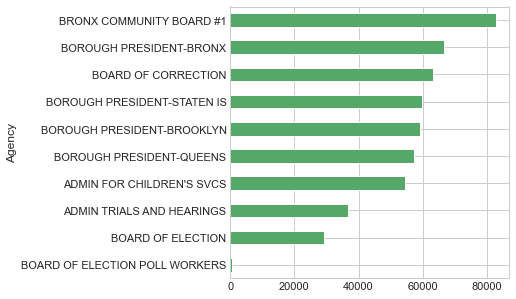

In [77]:
# Pay Basis 'per Annum', 'per Day', 'per Hour', 'Prorated Annual'
dfBar = dff3
dfBar = pd.DataFrame({'Agency': dfBar['Agency Name'],
                    'Gross': dfBar['Regular Gross Paid'],
                    'Base': dfBar['Base Salary']
                   })
# dff3 = dff3.groupby(by=['Agency']).mean()['Base']
dfBar = dfBar.groupby(['Agency']).median()['Gross']
dfBar.head(10).sort_values().plot(kind='barh', figsize=(5,5), color='g')
plt.show()

The Base Salary column contains four classes of salary.  We are using 'Regular Gross Paid' where we can get the same insights if we were to convert the Base Salary column to annual figures. What's important to point out is that 'Regular Gross Paid' should be a strong predictor for a classification problem when we get into the higher salaries. 

### Top 10 Median Salaries by Job Title

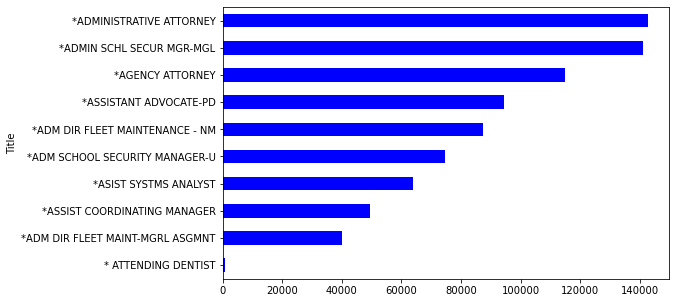

In [44]:
# Pay Basis 'per Annum', 'per Day', 'per Hour', 'Prorated Annual'

dfBarTitle = dff3
dfBarTitle = pd.DataFrame({'Title': dfBarTitle['Title Description'],
                    'Gross': dfBarTitle['Regular Gross Paid'],
                    'Base': dfBarTitle['Base Salary']
                   })
# dff3 = dff3.groupby(by=['Agency']).mean()['Base']
dfBarTitle = dfBarTitle.groupby(['Title']).median()['Gross']
dfBarTitle.head(10).sort_values().plot(kind='barh', figsize=(8,5), color='b')
plt.show()

There are 1763 unique job titles. Classifying them using a model will be more difficult than classifying the Agency. But our model should still perfrom well given the data.The higher the salary, the easier it will be to predict job title. When we get to the mid and lower salaries, Pay Basis will help with classifying.

In [45]:
dfTitles = pd.DataFrame({'Titles': dff3['Title Description'].unique()})
dfTitles.count()

Titles    1763
dtype: int64

This small table supports our Job Titles bar chart. We are showing the number of unique job titles.

### Change in Base Salary Over Time

In [46]:
df5 = pd.DataFrame({
    'Year': ['2015', '2016', '2017', '2018', '2019', '2020',
             '2014', '2015', '2016', '2017', '2018', '2019', '2020',
             '2015', '2016', '2017', '2018', '2019', '2020',
             '2014', '2015', '2016', '2017', '2018', '2019', '2020'
            ],
    'MedianBase': [
        dff3[(dff3['Fiscal Year'] > 2014) & (dff3['Fiscal Year'] < 2016) & (dff3['Pay Basis'] == 'per Hour')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2015) & (dff3['Fiscal Year'] < 2017) & (dff3['Pay Basis'] == 'per Hour')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2016) & (dff3['Fiscal Year'] < 2018) & (dff3['Pay Basis'] == 'per Hour')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2017) & (dff3['Fiscal Year'] < 2019) & (dff3['Pay Basis'] == 'per Hour')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2018) & (dff3['Fiscal Year'] < 2020) & (dff3['Pay Basis'] == 'per Hour')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2019) & (dff3['Fiscal Year'] < 2021) & (dff3['Pay Basis'] == 'per Hour')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] < 2015) & (dff3['Pay Basis'] == 'per Annum')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2014) & (dff3['Fiscal Year'] < 2016) & (dff3['Pay Basis'] == 'per Annum')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2015) & (dff3['Fiscal Year'] < 2017) & (dff3['Pay Basis'] == 'per Annum')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2016) & (dff3['Fiscal Year'] < 2018) & (dff3['Pay Basis'] == 'per Annum')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2017) & (dff3['Fiscal Year'] < 2019) & (dff3['Pay Basis'] == 'per Annum')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2018) & (dff3['Fiscal Year'] < 2020) & (dff3['Pay Basis'] == 'per Annum')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2019) & (dff3['Fiscal Year'] < 2021) & (dff3['Pay Basis'] == 'per Annum')]['Base Salary'].median(),
        # dff3[(dff3['Fiscal Year'] < 2015) & (dff3['Pay Basis'] == 'per Day')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2014) & (dff3['Fiscal Year'] < 2016) & (dff3['Pay Basis'] == 'per Day')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2015) & (dff3['Fiscal Year'] < 2017) & (dff3['Pay Basis'] == 'per Day')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2016) & (dff3['Fiscal Year'] < 2018) & (dff3['Pay Basis'] == 'per Day')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2017) & (dff3['Fiscal Year'] < 2019) & (dff3['Pay Basis'] == 'per Day')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2018) & (dff3['Fiscal Year'] < 2020) & (dff3['Pay Basis'] == 'per Day')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2019) & (dff3['Fiscal Year'] < 2021) & (dff3['Pay Basis'] == 'per Day')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] < 2015) & (dff3['Pay Basis'] == 'Prorated Annual')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2014) & (dff3['Fiscal Year'] < 2016) & (dff3['Pay Basis'] == 'Prorated Annual')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2015) & (dff3['Fiscal Year'] < 2017) & (dff3['Pay Basis'] == 'Prorated Annual')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2016) & (dff3['Fiscal Year'] < 2018) & (dff3['Pay Basis'] == 'Prorated Annual')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2017) & (dff3['Fiscal Year'] < 2019) & (dff3['Pay Basis'] == 'Prorated Annual')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2018) & (dff3['Fiscal Year'] < 2020) & (dff3['Pay Basis'] == 'Prorated Annual')]['Base Salary'].median(),
        dff3[(dff3['Fiscal Year'] > 2019) & (dff3['Fiscal Year'] < 2021) & (dff3['Pay Basis'] == 'Prorated Annual')]['Base Salary'].median()
    ],
    'Pay Basis': ['per Hour', 'per Hour', 'per Hour', 'per Hour', 'per Hour', 'per Hour',
                  'per Annum', 'per Annum', 'per Annum', 'per Annum', 'per Annum', 'per Annum', 'per Annum',
                  'per Day', 'per Day', 'per Day', 'per Day', 'per Day', 'per Day',
                  'Prorated Annual', 'Prorated Annual', 'Prorated Annual', 'Prorated Annual', 'Prorated Annual', 'Prorated Annual', 'Prorated Annual'
                 ]
})

In [47]:

chart2 = alt.Chart(df5[(df5['Pay Basis']=='Prorated Annual') | (df5['Pay Basis']=='per Annum')])
selection = alt.selection_multi(fields=['Pay Basis'], bind='legend')
data = chart2.mark_line().encode(
    x='Year',
    y=alt.Y('MedianBase', title='Base Salary'),
    color='Pay Basis'
).properties(
    width=300,
    height=300
).configure_axis(
    labelFontSize=20,
    titleFontSize=20
).configure_legend(
    labelFontSize=20,
    titleFontSize=20,
    symbolSize=600,
    symbolStrokeWidth=4
)
data.display()


alt.Chart(...)

There are zero observations where Pay Basis is Prorated Annual in 2014.  We notice the similar results for 'per Day' and 'per Hour' (very few observations).  Over time, the trend is as expected for salary data, upward. It is likely that there was some policy change that allowed for prorated salaries, effective, fiscal year 2015. The implication here is that it might make more sense to train our model on fiscal years 2015 and up.  

In [48]:
chart2 = alt.Chart(df5[(df5['Pay Basis']=='per Hour') | (df5['Pay Basis']=='per Day')])
selection = alt.selection_multi(fields=['Pay Basis'], bind='legend')
data = chart2.mark_line().encode(
    x='Year',
    y=alt.Y('MedianBase', title='Base Salary'),
    color='Pay Basis'
).properties(
    width=300,
    height=300
).configure_axis(
    labelFontSize=20,
    titleFontSize=20
).configure_legend(
    labelFontSize=20,
    titleFontSize=20,
    symbolSize=600,
    symbolStrokeWidth=4
)
data.display()



alt.Chart(...)

#### Per Hour:
The number of observations for the 2014 fiscal year for the Per Hour pay basis is 168. Additionally, 133 of those observed show to have a pay rate of 1 dollar an hour. Therefore, 2014 is excluded from this visual for the pay basis of 'per Hour'. There is significant increase from 2015 to 2020.

#### Per Day:
The number of observations for the 2014 fiscal year for the Per Day pay basis, and where base salary is above 50 dollars per day are both 15. Therefore, 2014 is excluded from this visual for the pay basis of 'per Day'.  Additionnally, there is no change in median pay per day from 2015 to 2020. A quick look at the job titles associated with per day pay basis reveals that most of these positions are temorary.  For example, there are 46311 substitute teachers.  The amount that these workers receive is likely voted on by citizens rather than negotiated. We don't have data to back this up, but typically salaries increase over time for various reasons. They are either negotiated, or organizations keep their compensation practices in line with the industry in order to attract and retain the best talent

In [49]:
# dff3[(dff3['Fiscal Year'] < 2015) & (dff3['Pay Basis'] == 'per Hour')].count()
# dff3[(dff3['Fiscal Year'] < 2015) & (dff3['Pay Basis'] == 'per Day')].count()
pd.DataFrame({
    'Fiscal Year': '2014',
    'Metric': ['Pay Per Hour = 1', 'Pay Per Day > 50', 'Total Per Hour', 'Total Per Day'],
    'Count': [
        dff3[(dff3['Fiscal Year'] < 2015) & (dff3['Pay Basis'] == 'per Hour') & (dff3['Base Salary'] == 1)]['Base Salary'].count(),
        dff3[(dff3['Fiscal Year'] < 2015) & (dff3['Pay Basis'] == 'per Day') & (dff3['Base Salary'] > 50)]['Base Salary'].count(),
        dff3[(dff3['Fiscal Year'] < 2015) & (dff3['Pay Basis'] == 'per Hour')]['Base Salary'].count(),
        dff3[(dff3['Fiscal Year'] < 2015) & (dff3['Pay Basis'] == 'per Day')]['Base Salary'].count()
        
    ]
})

,Fiscal Year,Metric,Count
0,2014,Pay Per Hour = 1,133
1,2014,Pay Per Day > 50,15
2,2014,Total Per Hour,168
3,2014,Total Per Day,15


We are displaying this table to support our statements about the line charts above (The one with per Day and Per Hour). This shows the number of employees at 1 dollar per hour in 2014 and the number of employees above 50 dollars per hour in 2014.  This backs up our resoning for not including fiscal year 2014.

In [50]:
dff3[(dff3['Fiscal Year'] > 2014) & (dff3['Pay Basis'] == 'per Day')]['Title Description'].value_counts().head(10)

TEACHER- PER SESSION            519336
TEACHER-GENERAL ED               71462
SUBSTITUTE ED PARA               46311
ADJUNCT LECTURER                 20436
MAINTENANCE WORKER                9132
SCHOOL SECRETARY PER SESSION      6521
AUTO MECHANIC                     6401
SUPERVISOR PER SESSION            6292
ADJUNCT ASSISTANT PROFESSOR       5679
SEWAGE TREATMENT WORKER           4436
Name: Title Description, dtype: int64

The purpose of this table is to support our statement about the number of the different job titles that are paid per day.

### Employees with the Highest Hourly Pay

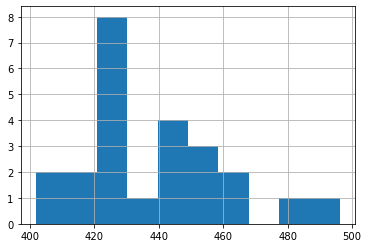

In [51]:
dff3[(dff3['Pay Basis'] == 'per Hour') & (dff3['Base Salary'] > 400) & (dff3['Base Salary'] < 500)]['Base Salary'].hist()
plt.show()

#### This is not a mistake.
There are employees who earn between 400 and 500 per hour.  There are very few and they all work in the Civil Service Commision.  The implcations are that a classification model should easily identify the Agency Name but will have trouble with accurately identifying the title description.  For this entire data set, we should look at median salaries.  Any interpretations or conclusions based on the mean would be suspect.

In [52]:
dff3[(dff3['Pay Basis'] == 'per Hour') & (dff3['Base Salary'] > 400) & (dff3['Base Salary'] < 500)][['Agency Name', 'Title Description', 'Base Salary']].head()

,Agency Name,Title Description,Base Salary
126778,CIVIL SERVICE COMMISSION,COMMISSIONER,455.70
126780,CIVIL SERVICE COMMISSION,CHAIRMAN,496.31
126782,CIVIL SERVICE COMMISSION,COMMISSIONER,455.70
126783,CIVIL SERVICE COMMISSION,COMMISSIONER,455.70
705918,CIVIL SERVICE COMMISSION,CHAIRMAN,448.55


We included this table to support the histogram with highest hourly pay above. This shows that the employees with the highest hourly pay are all from the same agency.

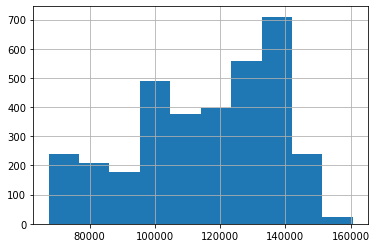

In [53]:
dff3[(dff3['Pay Basis'] == 'per Hour') & (dff3['Base Salary'] > 500)]['Base Salary'].hist()
plt.show()

#### This must be a mistake.
What is interesting here is the extremely high hourly rate for the employees making more than 500 dollars per hour in the histogram. But notice in the table that all these employees have zero hours worked.  It could be that the Pay Basis for this subset should be in the 'per Annum' class. We should move this subset to that class and perform some calculations to convert the hourly rate to an annual rate and place that into a new column named AnnualSalary when we perform our predictions. Or we can use the Regular Gross Paid column which will yield the same benefit for a classification problem.

In [54]:
dff3[(dff3['Pay Basis'] == 'per Hour') & (dff3['Base Salary'] > 500)][['Base Salary', 'Regular Hours']].describe()

,Base Salary,Regular Hours
count,3417.000000,3417.0
mean,115089.705891,0.0
std,21076.331384,0.0
min,67440.900000,0.0
25%,101995.670000,0.0
50%,118559.800000,0.0
75%,133863.680000,0.0
max,160683.390000,0.0


This table supports our statement that the high salaries (>20000 per hour), with zero hours worked must be a mistake.

In [56]:
# dff3.groupby(['Pay Basis'])['First Name'].count()

## Explore Joint Attributes

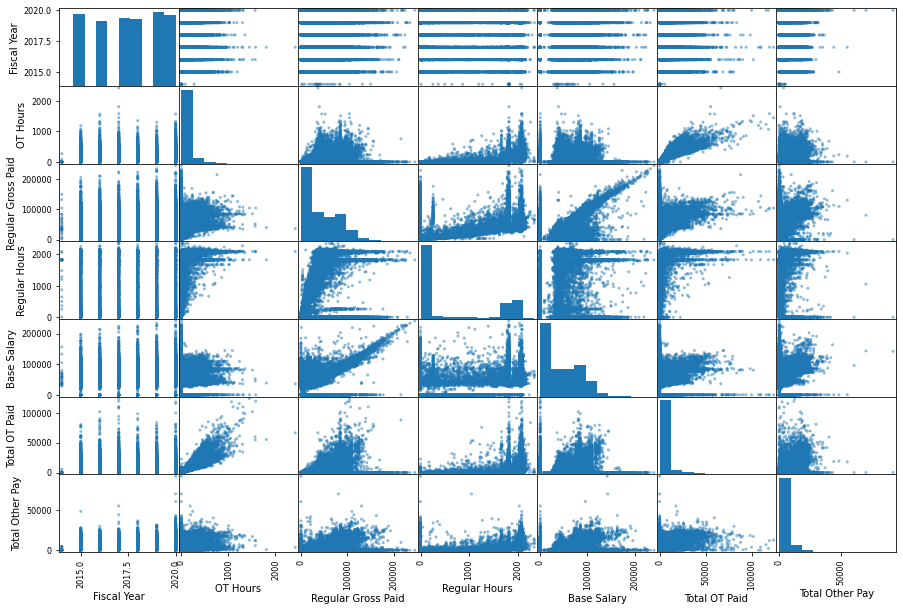

In [55]:
scatter_matrix(dff3.sample(30000), figsize=(15, 10))
plt.show()

We ran a scatter matrix on a random sample of 30000 observations from the data set to reduce processing time. 

#### OT Hours
Over Time Hours is strongly corelated with Total Overtime Paid, with a positive correlation. But this is not the case between OT Hours and Regular Gross Paid.  Regular Gross Paid is gross salary, including overtime. But not all employees work overtime, such as those who are paid annually.

#### Base Salary
Base salary and Regular Gross Paid certainly have a strong positive correlation. Here we have not converted Base Salary to all annual figures. The variation that is shown is due to Base Salary including the 'per Hour' and 'per Day' classes. If this Base Salary were converted to all annual figures, the correlation with RGP would be much stronger.

#### Regular Hours
Regular Hours and Regular Gross Paid have a positive correlation. This correlation would be stronger if we were only dealing with employees who have their hours tracked. Here again we see that there are many employees whose hours worked is not tracked. This makes Regular Hours a weak predictor for a regression problem. It will be strong for a classification problem. Separating job titles by those with hours worked and those with none is a good starting point.  

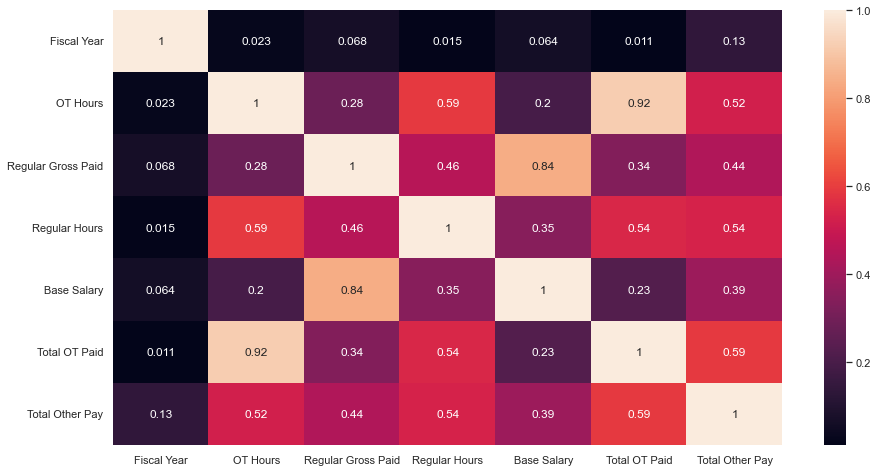

In [78]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(dff3.sample(30000).corr(), annot=True);
plt.show()

We use the correlation heatmap to expand on Regular Hours. It is not as noticable in the scatterplot, but regular hours and Total OT Paid have a significant correlation. An employee with a lot of overtime will certainly have maxed out (or come close to maxing out) in Regular Hours. Regular hours would be a better attribute to use for a predictive model. There are more employees with regular hours than those who worked overtime. And all of the employees who worked overtime will have regular hours.


## Explore Joint Attributes and Class

In [57]:
plt.style.use('seaborn-whitegrid')

## Lets Analyze which factors can be used for making potential predictions for income rates for municipal employees in NYC.

Theres a relationship between job title and base salary for employees who are getting an hourly rate. The civil service commission has employees who make an above average hourly rate compared to others in this same category of pay type (Hourly Rate).

In [82]:
dff3[(dff3['Pay Basis'] == 'per Hour') & (dff3['Base Salary'] > 400) & (dff3['Base Salary'] < 500)][['Agency Name', 'Title Description', 'Base Salary']].head(10)

,Agency Name,Title Description,Base Salary
126778,CIVIL SERVICE COMMISSION,COMMISSIONER,455.70
126780,CIVIL SERVICE COMMISSION,CHAIRMAN,496.31
126782,CIVIL SERVICE COMMISSION,COMMISSIONER,455.70
126783,CIVIL SERVICE COMMISSION,COMMISSIONER,455.70
705918,CIVIL SERVICE COMMISSION,CHAIRMAN,448.55
705924,CIVIL SERVICE COMMISSION,COMMISSIONER,411.85
705928,CIVIL SERVICE COMMISSION,COMMISSIONER,411.85
1244411,CIVIL SERVICE COMMISSION,CHAIRMAN,437.61
1244419,CIVIL SERVICE COMMISSION,COMMISSIONER,401.80
1244423,CIVIL SERVICE COMMISSION,COMMISSIONER,401.80


## When and where were the highest salaries in the New York area from 2014 to 2020 ?
The table below illustrates the difference and change in pay overtime for different job titles by year and county. This gives us a better idea of what the trend in pay is and that there seems to be a negative pattern overtime. (See "Years with the Largest and Smallest Gross Pay" below for illustration)

In [59]:
df5 = df3.groupby(['Title Description', 'Fiscal Year', 'Work Location Borough'])['Regular Gross Paid'].mean()
df5.head(50)

Title Description                 Fiscal Year  Work Location Borough
* ATTENDING DENTIST               2016         BRONX                       357.220000
                                               QUEENS                     1422.080000
*ADM DIR FLEET MAINT-MGRL ASGMNT  2015         MANHATTAN                 40044.630000
*ADM DIR FLEET MAINTENANCE - NM   2015         QUEENS                   128685.440000
                                  2016         QUEENS                   128350.330000
                                  2017         MANHATTAN                   390.476667
                                               QUEENS                   166972.610000
                                  2018         QUEENS                    87364.960000
*ADM SCHOOL SECURITY MANAGER-U    2015         QUEENS                    69983.680000
                                  2017         BRONX                     84594.510000
                                               MANHATTAN               

In [60]:
df6 = df3.groupby(['Title Description', 'Fiscal Year']).mean()
df6.head(20).sort_values(by=['Base Salary'], ascending=True)

OT Hours  Regular Gross Paid  \
Title Description                Fiscal Year                                 
*ADM SCHOOL SECURITY MANAGER-U   2015         214.6875        69983.680000   
                                 2020           0.0000        28565.277500   
                                 2018         158.8125        64117.560000   
                                 2017         221.8750        82908.327500   
*AGENCY ATTORNEY                 2018         100.5500       107941.446000   
* ATTENDING DENTIST              2016           0.0000          889.650000   
*ADM DIR FLEET MAINT-MGRL ASGMNT 2015           0.0000        40044.630000   
*ADM DIR FLEET MAINTENANCE - NM  2016          39.0000       128350.330000   
                                 2015          54.0000       128685.440000   
                                 2017          16.5000        42036.010000   
*ADMIN SCHL SECUR MGR-MGL        2015           0.0000       139547.990000   
*ADM DIR FLEET MAINTENANCE - NM  2018           0.0000        87364.960000   
*ADMIN SCHL SECUR MGR-MGL        2016           0.0000       142324.390000   
*ADMINISTRATIVE ATTORNEY         2016           0.0000       132928.332500   
                                 2018           0.0000       161278.253333   
                                 2015           0.0000       140078.980000   
*ADMIN SCHL SECUR MGR-MGL        2018           0.0000       162536.400000   
*ADMINISTRATIVE ATTORNEY         2017           0.0000       153840.807500   
                                 2020           0.0000       144860.320000   
*ADMIN SCHL SECUR MGR-MGL        2020           0.0000       132362.370000   

                                              Regular Hours    Base Salary  \
Title Description                Fiscal Year                                 
*ADM SCHOOL SECURITY MANAGER-U   2015           1955.350000   70176.000000   
                                 2020            653.295000   82560.750000   
                                 2018           1438.387500   82560.750000   
                                 2017           1923.220000   84017.250000   
*AGENCY ATTORNEY                 2018           1790.000000  110605.600000   
* ATTENDING DENTIST              2016              0.000000  115771.000000   
*ADM DIR FLEET MAINT-MGRL ASGMNT 2015              0.000000  118034.000000   
*ADM DIR FLEET MAINTENANCE - NM  2016           2091.420000  129039.000000   
                                 2015           2085.720000  129039.000000   
                                 2017            521.430000  132753.500000   
*ADMIN SCHL SECUR MGR-MGL        2015           1825.000000  140341.000000   
*ADM DIR FLEET MAINTENANCE - NM  2018           1245.720000  142358.000000   
*ADMIN SCHL SECUR MGR-MGL        2016           1830.000000  143850.000000   
*ADMINISTRATIVE ATTORNEY         2016           1472.000000  160782.250000   
                                 2018           1801.666667  161721.333333   
                                 2015           1460.000000  161845.800000   
*ADMIN SCHL SECUR MGR-MGL        2018           1790.000000  162983.000000   
*ADMINISTRATIVE ATTORNEY         2017           1368.750000  164315.000000   
                                 2020           1633.333333  173727.333333   
*ADMIN SCHL SECUR MGR-MGL        2020           1323.000000  185587.000000   

                                              Total OT Paid  Total Other Pay  \
Title Description                Fiscal Year                                   
*ADM SCHOOL SECURITY MANAGER-U   2015             10452.465      2087.607500   
                                 2020                 0.000     12569.175000   
                                 2018              9509.235      6607.585000   
                                 2017             13356.955      2051.950000   
*AGENCY ATTORNEY                 2018              7149.104       379.148000   
* ATTENDING DENTIST              2016               

### Years with the Largest and Smallest Gross Pay

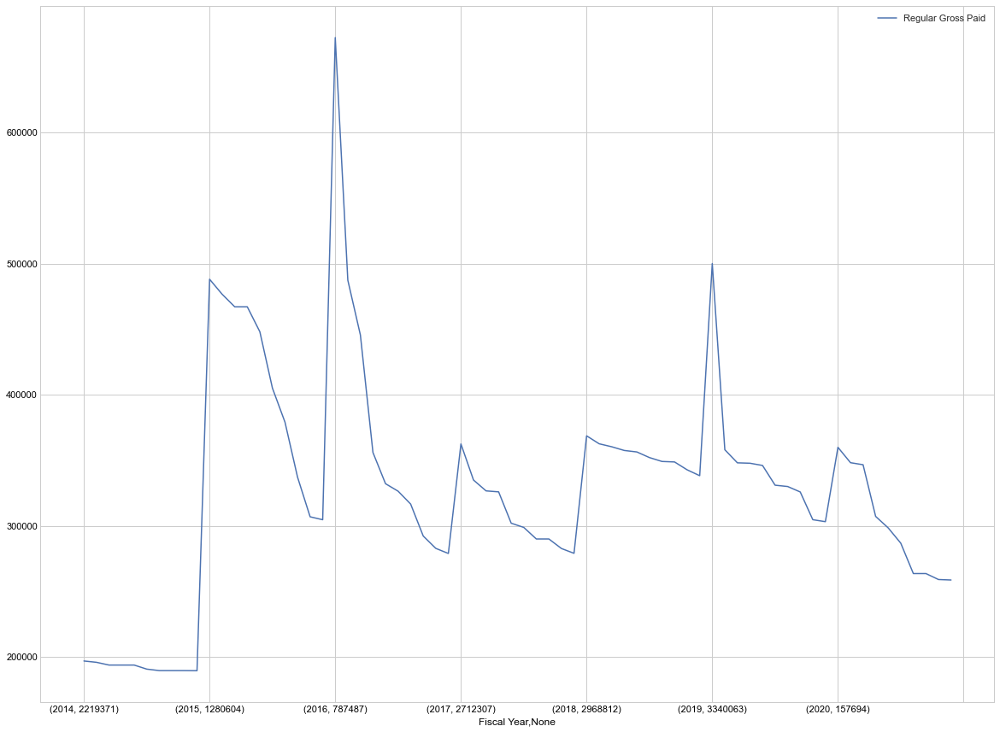

In [63]:
fig = df3.groupby('Fiscal Year')['Regular Gross Paid'].nlargest(10).plot(figsize=(20, 15), legend = True)
fig.xaxis.label.set_color('black')
fig.tick_params(axis='x', colors='black')
fig.tick_params(axis='y', colors='black')
plt.show()

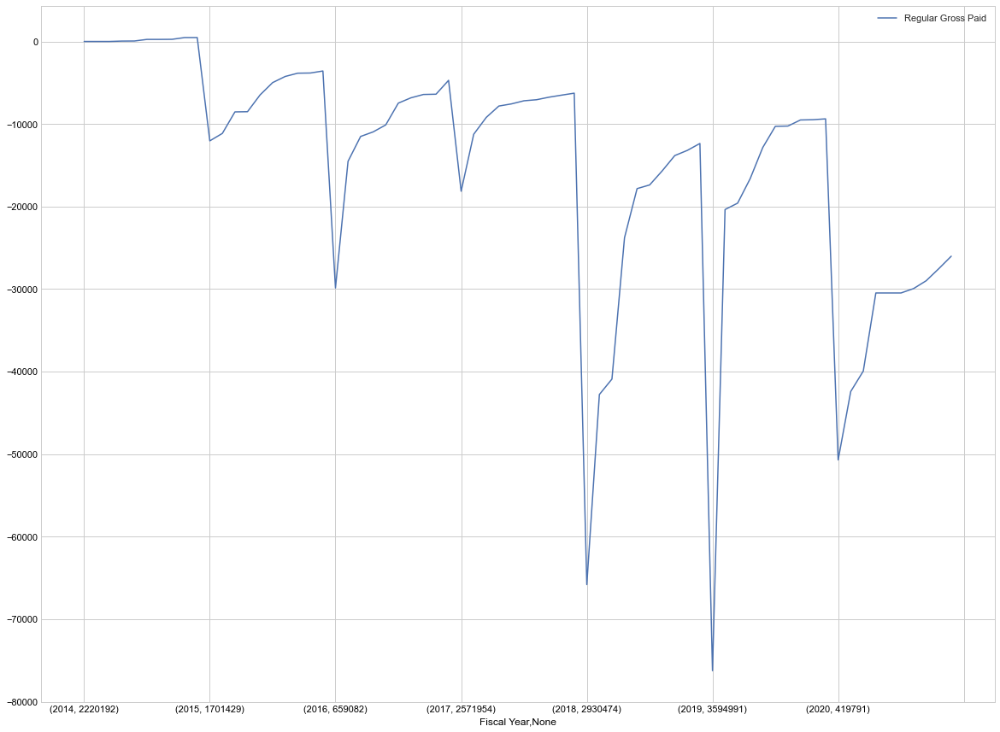

In [64]:
fig = df3.groupby('Fiscal Year')['Regular Gross Paid'].nsmallest(10).plot(figsize=(20, 15), legend = True)
fig.xaxis.label.set_color('black')
fig.tick_params(axis='x', colors='black')
fig.tick_params(axis='y', colors='black')
plt.show()

We see here a negative trend for overall pay from 2014 to 2020. It would be interesting to also assess this similar trend after 2020 using a regression model to see how this trend has changed or remained the same post pandemic.

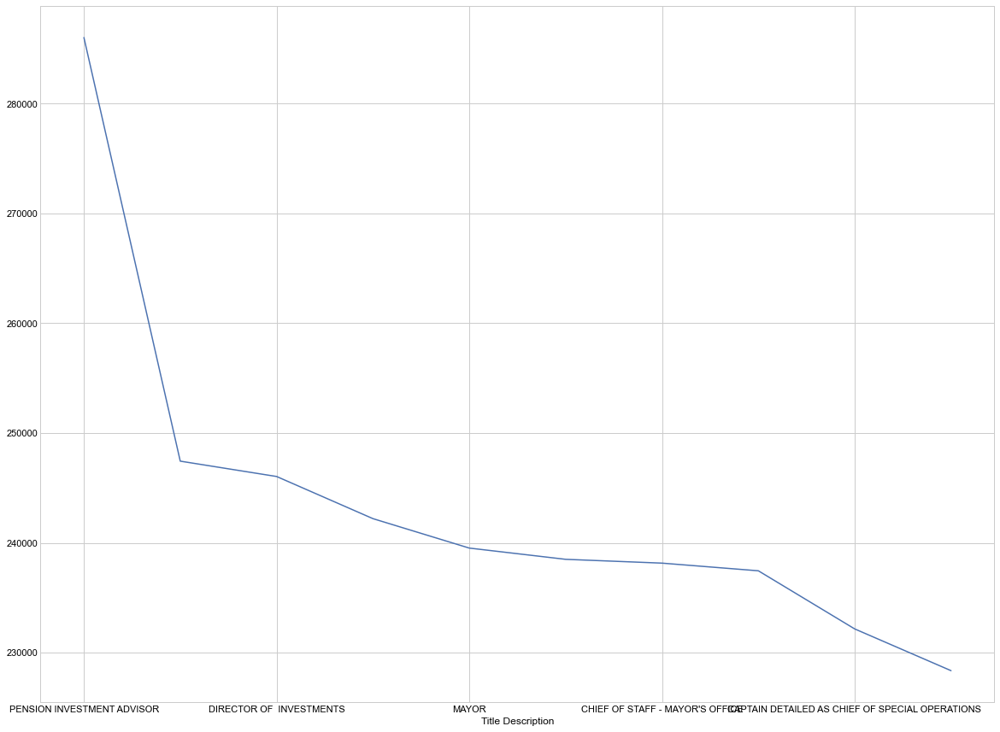

In [66]:
#df3.groupby('Title Description')['Base Salary'].sum().nlargest(10).plot(figsize=(10, 5), legend = True)
fig = df3.groupby(['Title Description'])['Regular Gross Paid'].mean().nlargest(10).plot(figsize=(20, 15))
fig.xaxis.label.set_color('black')
fig.tick_params(axis='x', colors='black')
fig.tick_params(axis='y', colors='black')
plt.show()

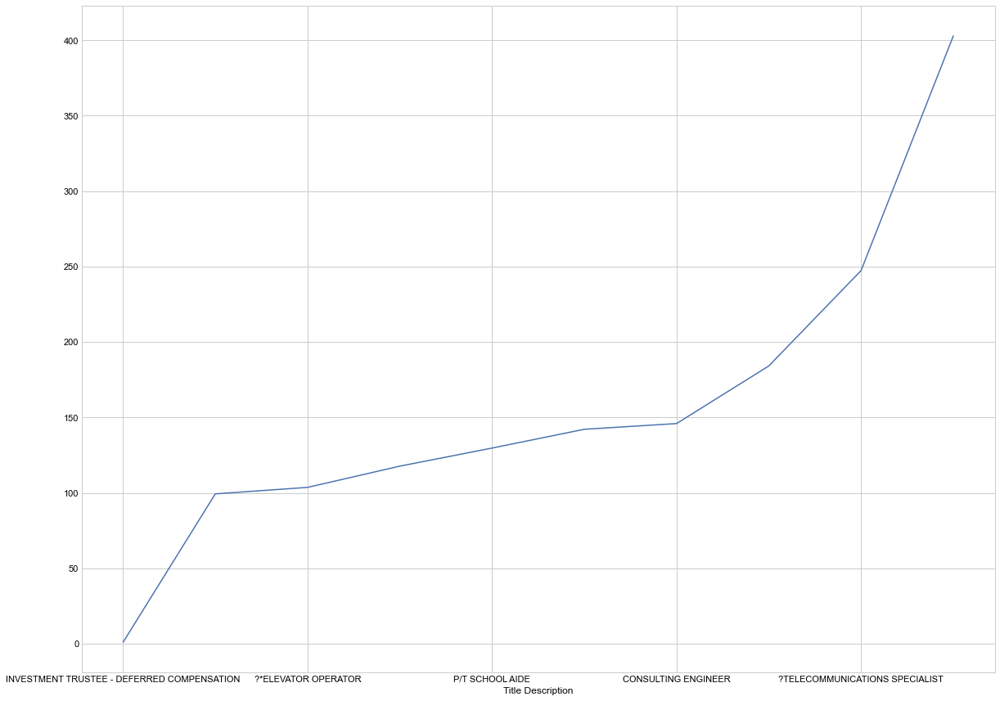

In [67]:
fig = df3.groupby(['Title Description'])['Regular Gross Paid'].mean().nsmallest(10).plot(figsize=(20, 15))
fig.xaxis.label.set_color('black')
fig.tick_params(axis='x', colors='black')
fig.tick_params(axis='y', colors='black')
plt.show()

We wanted to analyze which jobs were the highest and lowest paying jobs. This metric will help us get a good metric on the min and max gross pay rates and which jobs are associated to those rates when we eventually create our prediction model for job title.

## New Features

The Job category column was added to the dataset to help in the regression modelling process later on as we looked predict job title based on other variables in the dataset.

In [79]:
df3.head(5)

,Fiscal Year,OT Hours,Regular Gross Paid,Regular Hours,Pay Basis,Base Salary,Leave Status as of June 30,Total OT Paid,Agency Name,Agency Start Date,Title Description,Last Name,First Name,Total Other Pay,Work Location Borough,Job Category
0,2020,0.0,84698.21,1820.0,per Annum,86005.0,ACTIVE,0.0,OFFICE OF EMERGENCY MANAGEMENT,08/10/2015,EMERGENCY PREPAREDNESS MANAGER,BEREZIN,MIKHAIL,0.0,BROOKLYN,908
1,2020,0.0,84698.21,1820.0,per Annum,86005.0,ACTIVE,0.0,OFFICE OF EMERGENCY MANAGEMENT,09/12/2016,EMERGENCY PREPAREDNESS MANAGER,GEAGER,VERONICA,0.0,BROOKLYN,908
2,2020,0.0,84698.21,1820.0,per Annum,86005.0,ACTIVE,0.0,OFFICE OF EMERGENCY MANAGEMENT,02/22/2016,EMERGENCY PREPAREDNESS MANAGER,RAMANI,SHRADDHA,0.0,BROOKLYN,908
3,2020,0.0,84698.21,1820.0,per Annum,86005.0,ACTIVE,0.0,OFFICE OF EMERGENCY MANAGEMENT,09/16/2013,EMERGENCY PREPAREDNESS MANAGER,ROTTA,JONATHAN,0.0,BROOKLYN,908
4,2020,0.0,84698.21,1820.0,per Annum,86005.0,ACTIVE,0.0,OFFICE OF EMERGENCY MANAGEMENT,04/30/2018,EMERGENCY PREPAREDNESS MANAGER,WILSON II,ROBERT,0.0,BROOKLYN,908


Other new features to be included would a Annual Salary column that takes the annual rate of pay for all pay types ("per Day, "per Hour", "per Annum", "per Annum prorated"). This will help us predict the overall salaries of employees when we get to model creation.

## Exceptional Work

### Is location a factor in who makes high or lower annual wages?
First lets group the data by location or in this case work location borough and by fiscal year so we accurately assess trends overtime. Its best to assess location statistics geographically to get the best understanding of how location comes into play when looking at the data. To that end we'll join the dataset to a shapefile of the counties of New York state. 

In [69]:
df4 = df3.groupby(['Work Location Borough', 'Fiscal Year'], as_index=False).mean()
df4.head()

,Work Location Borough,Fiscal Year,OT Hours,Regular Gross Paid,Regular Hours,Base Salary,Total OT Paid,Total Other Pay,Job Category
0,ALBANY,2015,77.569444,62678.271667,1535.256111,68151.695556,3963.209444,2982.631667,1331.611111
1,ALBANY,2016,74.000000,58967.958000,1378.178000,65924.368000,4058.476000,1571.148667,1179.000000
2,ALBANY,2017,124.764167,78058.831667,1862.800000,62081.043333,6932.536667,1362.846667,1224.666667
3,ALBANY,2018,101.142857,97186.129286,1714.074286,62874.122857,10834.219286,2175.214286,1285.071429
4,ALBANY,2019,95.650000,75939.255333,1609.869333,71264.544000,7142.512000,1676.939333,1205.133333


In [71]:
import geopandas as gpd
import shapely
import matplotlib.pyplot as plt
from shapely.geometry import Point, Polygon

# Counties import for Yvan's laptop
# Counties = gpd.read_file('data/Counties.shp')

# Counties import for Andre's laptop
Counties = gpd.read_file('data\Counties.shp')

Counties['Work Location Borough'] = Counties['NAME'].str.upper()
Counties = Counties.to_crs(epsg=4326)
#Counties.plot(figsize=(20, 35))

In [72]:
import branca.colormap as cm
import folium
import geopandas as gpd
import numpy as np
import pandas as pd
import datetime
import time
import json
%matplotlib inline

#spatial_df = df4.merge(Counties, on='Work Location Borough')
spatial_df = Counties.merge(df4, on='Work Location Borough', how = 'inner')
spatial_df = spatial_df.sort_values(by=['Fiscal Year'], ascending=True)
spatial_df['Fiscal Year'] = pd.to_datetime(spatial_df['Fiscal Year'], format = '%Y')
spatial_df['date_sec'] = (spatial_df['Fiscal Year'] - pd.Timestamp("1969-01-01")) // pd.Timedelta('1s')
#spatial_df['date_sec'] = spatial_df['Fiscal Year'].dt.strftime('%Y/%m/%d')
#spatial_df['date_sec'] = spatial_df['Fiscal Year'].values.astype("datetime64[ns]").astype(int)
#spatial_df['date_sec'] = pd.to_datetime(spatial_df['Fiscal Year']).values.astype(int) / 10**9
#spatial_df['date_sec'] = spatial_df['date_sec'].astype(int).astype(str)
#spatial_df['log_basesalary'] = np.log10(spatial_df['Base Salary'])
spatial_df = spatial_df[['Work Location Borough', 'date_sec', 'Regular Gross Paid', 'POP2010', 'geometry']]




In [73]:


mymap = folium.Map(tiles='cartodbpositron')
mymap.save(outfile='infinite_scroll.html')
mymap_fix_boundary = folium.Map(min_zoom=2, max_bounds=True, tiles='cartodbpositron')
mymap_fix_boundary.save(outfile='fix_boundary.html')
max_colour = max(spatial_df['Regular Gross Paid'])
min_colour = min(spatial_df['Regular Gross Paid'])
cmap = cm.linear.YlOrRd_09.scale(min_colour, max_colour)
spatial_df['colour'] = spatial_df['Regular Gross Paid'].map(cmap)

county_list = spatial_df['Work Location Borough'].unique().tolist()
county_idx = range(len(county_list))

style_dict = {}
for i in county_idx:
    county = county_list[i]
    result = spatial_df[spatial_df['Work Location Borough'] == county]
    inner_dict = {}
    for _, r in result.iterrows():
        inner_dict[r['date_sec']] = {'color': r['colour'], 'opacity': .5}
    style_dict[str(i)] = inner_dict
    
counties_df = spatial_df
counties_gdf = gpd.GeoDataFrame(counties_df)
counties_gdf = counties_gdf.drop_duplicates().reset_index()



In [74]:

from folium.plugins import TimeSliderChoropleth
%matplotlib inline

slider_map = folium.Map(min_zoom=2, max_bounds=True, tiles='cartodbpositron')

_ = TimeSliderChoropleth(
    data = counties_gdf.to_json(),
    styledict = style_dict
    
).add_to(slider_map)
folium.GeoJson(
    counties_gdf,
    tooltip=folium.features.GeoJsonTooltip(fields=['Work Location Borough', 'POP2010'], aliases=['Work Location Borough', 'POP2020']),
).add_to(slider_map)
_ = cmap.add_to(slider_map)


cmap.caption = "Average NYC Wages by County"
slider_map.save(outfile='TimeSliderChoropleth.html')
folium.LayerControl().add_to(slider_map)

The map below shows an interesting trend in the NY area. This indicates that the higher gross incomes are in the suburb and surrounding counties of NYC (The NYC area consisting on the NEW YORK, RICHMOND, QUEENS, KINGS, and BRONX counties). Compared to the overall population in the NYC area, the distribution of wealth seems to be all over the board compared to what seem to be the more affluent areas such as Westchester and Dutchess counties which consistently have the higher gross income levels overtime

In [75]:
slider_map